# Steps to do:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Apply a perspective transform to rectify binary image ("birds-eye view").
4. Use color transforms, gradients, etc., to create a thresholded binary image + Mask out uninteresting parts
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

We will use the above assigned step numbers to identify the corresponding parts of code below.

In [81]:

# Importing Libraries

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy as mve

#plt.rcParams['figure.figsize'] = [20, 15]



## Step 1: Camera Calibration & Undistortion
We compute the camera calibration matrix and distortion coefficients using the chess-board images provided for this purpose in the repo. For this we use fucntion calibrateCamera provided in OpenCV lib.

In [82]:
def camera_cal(debug=False):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            if (debug==True):
            # Drawing detected corners on an image
                img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        
                plt.figure(figsize=(10,10))
                plt.imshow(img)

    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
    #img1 = cv2.imread('./camera_cal/calibration1.jpg')
    #gray = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
    
    #ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    #gray = cv2.drawChessboardCorners(gray, (9,6), corners, ret)
    #plt.imshow(gray)
    #dst = cv2.undistort(img1, mtx, dist, None, mtx)
    
    #fig, axs = plt.subplots(3)
    #fig.suptitle('Undistorting an image')
    #axs[0].imshow(img1)
    #axs[1].imshow(gray)
    #axs[2].imshow(dst)
    
    
    return mtx, dist



### Step 2:  Test Rig for testing camera calibration function and distortion removal

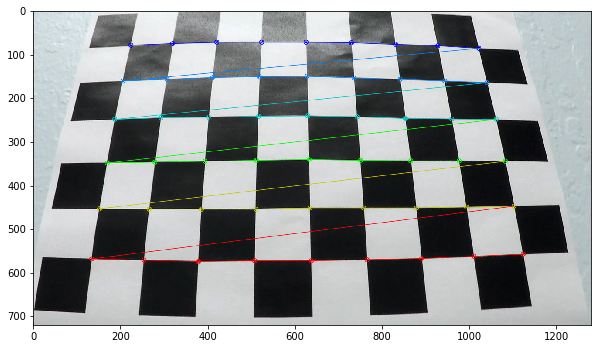

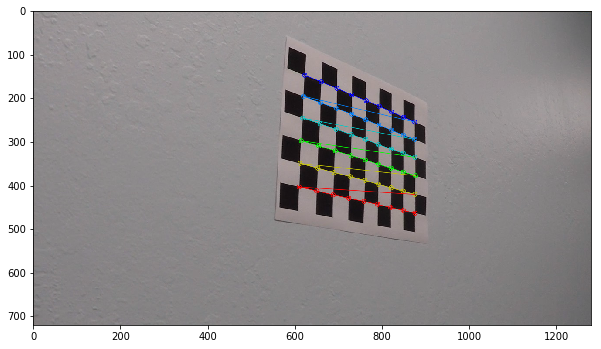

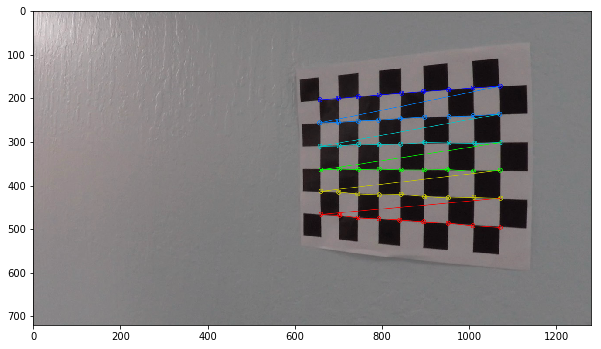

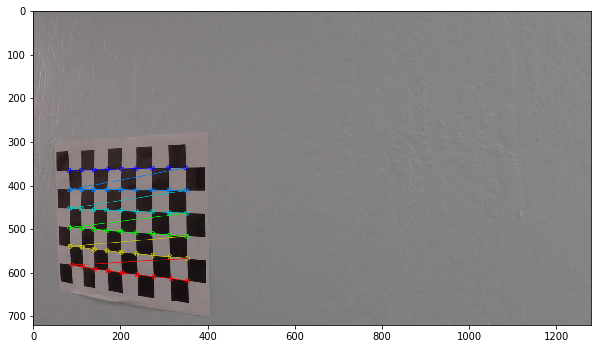

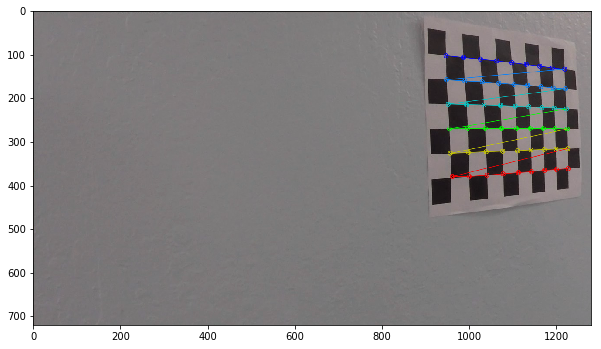

...

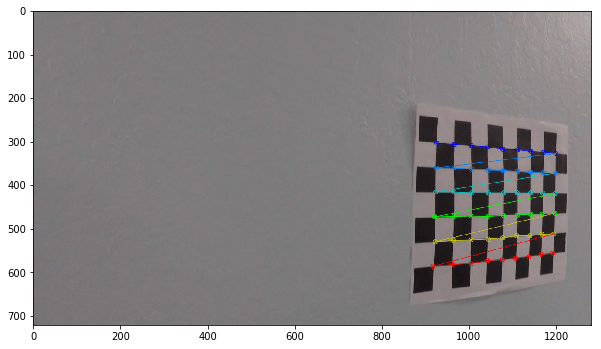

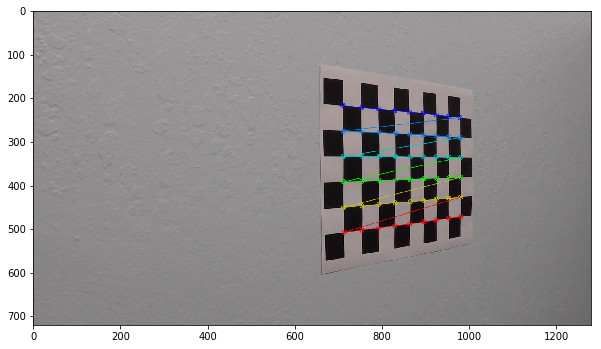

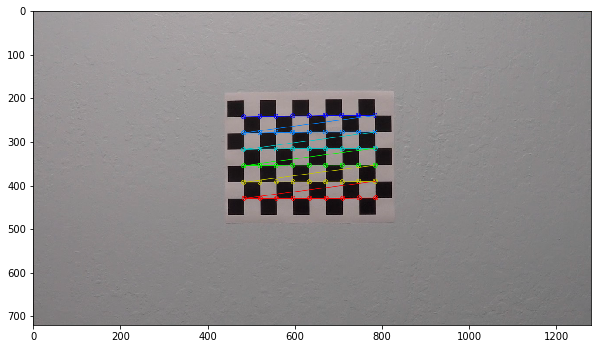

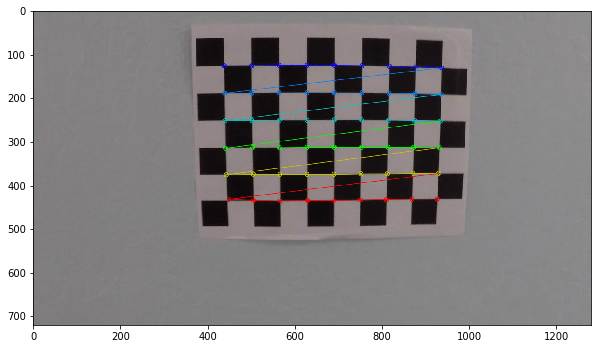

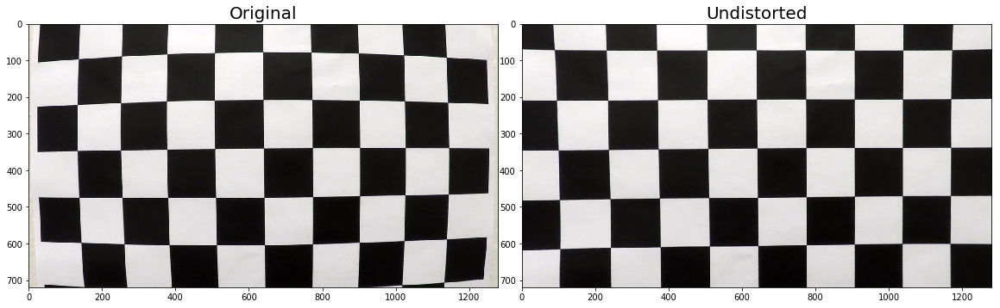

In [83]:
##Checking camera calibration
mtx, dist = camera_cal(debug=True)

# Read a test image
img = mpimg.imread("camera_cal/calibration1.jpg")
# Plot Original and Undistorted Test Image
plt.figure(figsize=(20,50))
plt.subplots_adjust(hspace = .2, wspace=.05)

# Plotting the original image
plt.subplot(1,2,1)
plt.title('Original', fontsize=20)
fig =plt.imshow(img)

# Undistorting the test image
img = cv2.undistort(img, mtx, dist, None, mtx)

# Plotting undistorted image
plt.subplot(1,2,2)
plt.title('Undistorted', fontsize=20)
fig =plt.imshow(img)

## Step 3:  Perspective Transform


In [84]:
def transform_prespective(img, mtx, dist, debug=False):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    img_size = (img.shape[1], img.shape[0])
    offset = 300

    # Source points taken from images with straight lane lines, these are to become parallel after the warp transform
    src = np.float32([
        (190, 720), # bottom-left corner
        (596, 447), # top-left corner
        (685, 447), # top-right corner
        (1125, 720) # bottom-right corner
    ])
    # Destination points are to be parallel, taken into account the image size
    dst = np.float32([
        [offset, img_size[1]],             # bottom-left corner
        [offset, 0],                       # top-left corner
        [img_size[0]-offset, 0],           # top-right corner
        [img_size[0]-offset, img_size[1]]  # bottom-right corner
    ])
    # Calculate the transformation matrix and it's inverse transformation
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size)
   
    return warped, M_inv



### Test rig for testing perspective transform function

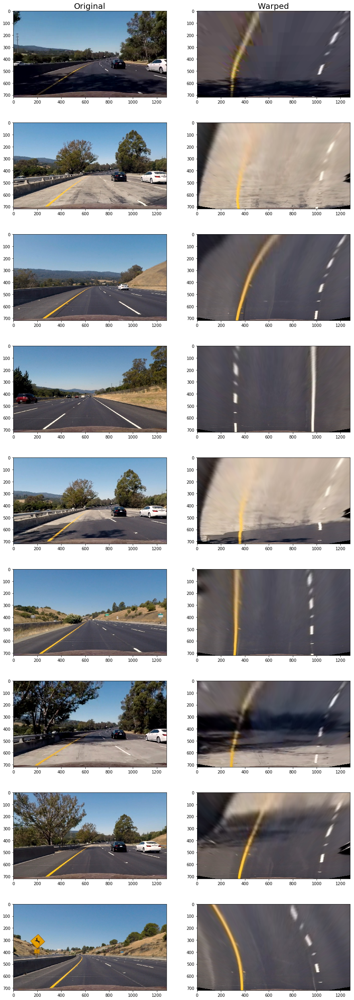

In [85]:
##Checking perspective transformation
#mtx, dist = camera_cal(debug=False)

# Read a test images
images = glob.glob('./test_images/*.jpg')

# setting up plot
plt.figure(figsize=(15,5*len(images)))
#plt.subplots_adjust(hspace = .02, wspace=.05)

for i in range(len(images)):
    img = mpimg.imread(images[i])
    img = cv2.undistort(img, mtx, dist, None, mtx)

    # Transforming the perspective
    warped, M_inv = transform_prespective(img, mtx, dist, debug=False)

    # Plotting the original image
    plt.subplot(len(images),2,(i*2)+1)
    if (i==0): plt.title('Original', fontsize=20)
    fig =plt.imshow(img)

    # Plotting undistorted & wraped image
    plt.subplot(len(images),2,(i*2)+2)
    if (i==0): plt.title('Warped', fontsize=20)
    fig =plt.imshow(warped)




##  Step 4.1: Region of interest selector

In [86]:
def ROI_selector(img, debug=False):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #vertices for ROI
    left_top = [int(img.shape[1]/2-50),int(img.shape[0]/2+60)]
    left_bottom = [0,img.shape[0]+100]
    right_top = [int(img.shape[1]/2+50),int(img.shape[0]/2+60)]
    right_bottom = [img.shape[1],img.shape[0]]
    vertices = np.array([[left_top, left_bottom, right_bottom, right_top]],dtype=np.int32)
    
    #defining a blank mask to start with
    mask = np.zeros_like(img)
    debug_img = np.zeros_like(img)
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    
    # return an image with ROI marked
    if (debug==True): 
        pts = vertices.reshape((-1,1,2))
        debug_img = cv2.polylines(img,[pts],True,(255,0,0),3)
    
    return masked_image, debug_img

###  Test Rig for ROI selector

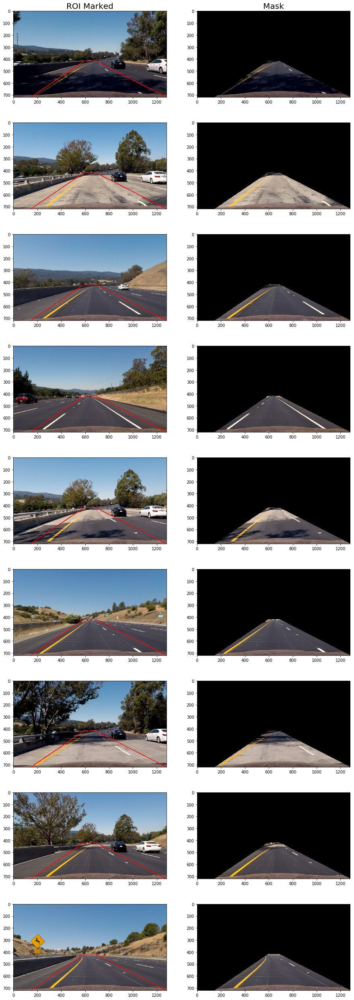

In [87]:
#mtx, dist = camera_cal(debug=False)

# Read a test images
#images = glob.glob('./test_images/*.jpg')


# setting up plot
plt.figure(figsize=(15,5*len(images)))
#plt.subplots_adjust(hspace = .02, wspace=.05)

#Draw region of interest in test images
for i in range(len(images)):
    img = mpimg.imread(images[i])
    img = cv2.undistort(img, mtx, dist, None, mtx)
    mask, debug_img = ROI_selector(img, True)


    # Plotting the original image
    plt.subplot(len(images),2,(i*2)+1)
    if (i==0): plt.title('ROI Marked', fontsize=20)
    fig =plt.imshow(debug_img)

    # Plotting undistorted & wraped image
    plt.subplot(len(images),2,(i*2)+2)
    if (i==0): plt.title('Mask', fontsize=20)
    fig =plt.imshow(mask)


##  Step 4.2: Thresholded binary 

In [88]:
def threshold_binary(img, debug=False):

    # Preliminaries
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    kernel_size = 3
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, kernel_size) # Take the derivative in x
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, kernel_size) # Take the derivative in y
    
    # Directional Gradient both in x & y and then combined
    thresh_min = 30
    thresh_max = 100
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative 
    abs_sobely = np.absolute(sobely) # Absolute y derivative 
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    sobel_bin = np.zeros_like(s_channel)
    #print ("sobel_bin.shape = ")
    #print (sobel_bin.shape)
    sobel_bin[((scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)) & ((scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max))] = 1
    
    
    
    # Gradient magnitude threshold
    thresh_min = 70
    thresh_max = 100
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2) # Calculating the magnitude
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy)) #scaling
    mag_bin = np.zeros_like(s_channel)
    mag_bin[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Gradient direction Threshold
    thresh_min_th = 0.7
    thresh_max_th = 1.3
    theta = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_bin = np.zeros_like(s_channel)
    dir_bin[(theta >= thresh_min_th) & (theta <= thresh_max_th)] = 1
    
    # Combining above two
    mag_dir_binary = np.zeros_like(s_channel)
    mag_dir_binary[((mag_bin == 1) & (dir_bin == 1))] = 1
    
    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    l_thresh_min = 100
    l_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    cs_binary = np.zeros_like(l_channel)
    cs_binary[((s_binary == 1) & (l_binary == 1))] = 1

    if (debug == True):
        # Stack each channel to view their individual contributions in RGB respectively
        color_binary = np.dstack((sobel_bin*255, mag_dir_binary*255, cs_binary*255))
        return color_binary

    # Combine the binary thresholds
    combined_binary = np.zeros_like(scaled_sobel)
    combined_binary[(cs_binary == 1) | (mag_dir_binary == 1) | (sobel_bin == 1)] = 1

    #print ("combined_binary.shape = ")
    #print (combined_binary.shape)
    
    return combined_binary

### Test rig for thresholded Binary function

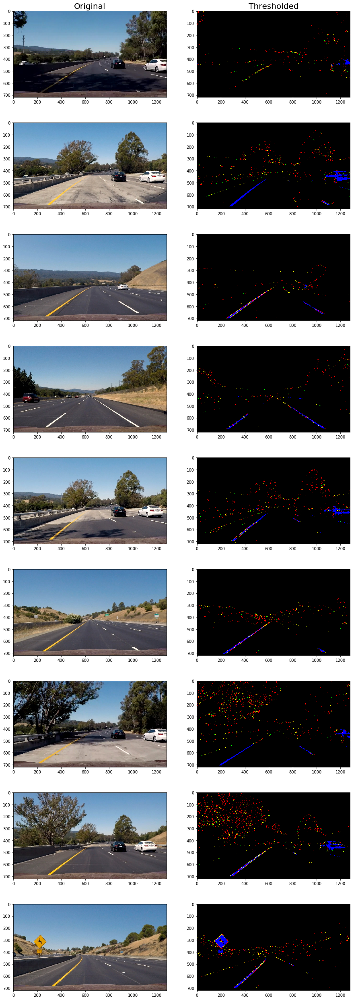

In [105]:
#mtx, dist = camera_cal(debug=False)

images_2_use = images


#mtx, dist = camera_cal(debug=False)

# Read a test images
#images = glob.glob('./test_images/*.jpg')

# setting up plot
plt.figure(figsize=(15,5*len(images_2_use)))
#plt.subplots_adjust(hspace = .02, wspace=.05)

for i in range(len(images_2_use)):
    img = mpimg.imread(images_2_use[i])
    img_orig = img.copy()
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    img=threshold_binary(img, debug=True)
    img_thresh = img.copy()
    
    img, debug_img = ROI_selector(img)
    img_roi = img.copy()

    # Transforming the perspective
    warped, M_inv = transform_prespective(img, mtx, dist, debug=False)
    
    

    # Plotting the original image
    cols = 2
    plt.subplot(len(images_2_use),cols,(i*cols)+1)
    if (i==0): plt.title('Original', fontsize=20)
    fig =plt.imshow(img_orig)
    
    # Plotting the thresholded image
    plt.subplot(len(images_2_use),cols,(i*cols)+2)
    if (i==0): plt.title('Thresholded', fontsize=20)
    fig =plt.imshow(img_thresh)

    # Plotting Roi selected image
    #plt.subplot(len(images),cols,(i*cols)+3)
    #if (i==0): plt.title('ROI Selected', fontsize=20)
    #fig =plt.imshow(img_roi, cmap='gray')

    # Plotting undistorted & wraped image
    #plt.subplot(len(images),cols,(i*cols)+3)
    #if (i==0): plt.title('Warped', fontsize=20)
    #fig =plt.imshow(warped, cmap='gray')

## Step 5: Detecting lane line pixels and fitting polynomials

In [90]:
def init_fitlines(binary_warped, debug=False):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
   
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 5
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if(debug):
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    
    # Fit a second order polynomial to each
    if len(leftx) == 0:
        left_fit =[]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) == 0:
        right_fit =[]
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return left_fit, right_fit, out_img

In [91]:
def fitlines(binary_warped, left_fit, right_fit, debug=False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    # If left_fit and right_fit are null, then call first_fitline to give first estimation
    if (left_fit==[] or right_fit==[]):
        left_fit, right_fit, out_img = init_fitlines(warped, False)
    
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    calc_left_x= left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
    calc_right_x= right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2]
    
    left_lane_inds = ((nonzerox > (calc_left_x - margin)) & (nonzerox < (calc_left_x + margin)))
    right_lane_inds = ((nonzerox > (calc_right_x - margin)) & (nonzerox < (calc_right_x + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new second order polynomial to each
    if len(leftx) == 0:
        left_fit =[]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) == 0:
        right_fit =[]
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    
    ## Visualization ##
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    if(debug):
        
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]    
        
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        # Plot the polynomial lines onto the image
        #plt.plot(left_fitx, ploty, color='yellow')
        #plt.plot(right_fitx, ploty, color='yellow')
        ## End visualization steps ##
    
    return left_fit, right_fit, out_img, lefty, leftx, righty, rightx, ploty   

### Testrig for Fit_lines

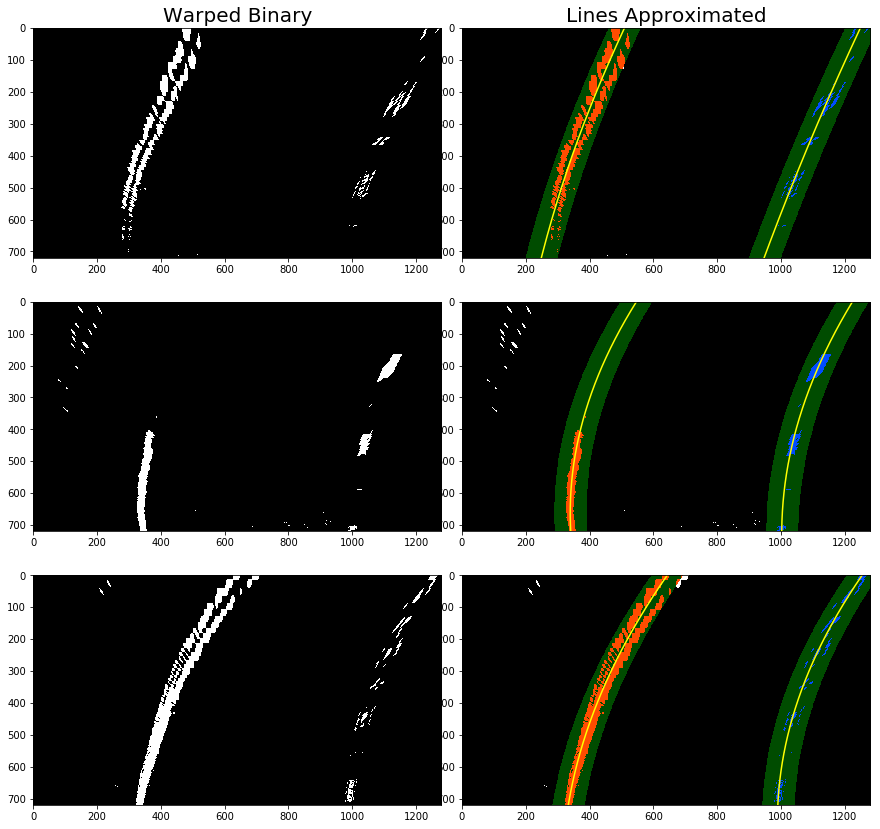

In [106]:
# Testing Fitlines Function


images_2_use = images[0:3]

# setting up plot
plt.figure(figsize=(15,5*len(images_2_use)))
plt.subplots_adjust(hspace = .02, wspace=.05)

for i in range(len(images_2_use)):
    img = mpimg.imread(images_2_use[i])
    img_orig = img.copy()
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    img=threshold_binary(img, debug=False)
    #print ("img.shape = {}".format(img.shape))
    
    img_thresh = img.copy()
    img, debug_img = ROI_selector(img)

    # Transforming the perspective
    warped, M_inv = transform_prespective(img, mtx, dist, debug=False)
    
    left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty = fitlines(warped, [], [], True)

    # Draw polyfit lines
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    
    # Plotting 
    cols = 2
    plt.subplot(len(images_2_use),cols,(i*cols)+1)
    if (i==0): plt.title('Warped Binary', fontsize=20)
    fig =plt.imshow(warped, cmap='gray')
    
    plt.subplot(len(images_2_use),cols,(i*cols)+2)
    if (i==0): plt.title('Lines Approximated', fontsize=20)
    fig =plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    #break


##  Step 6: Determine lane curvature and vehicle offset

In [93]:
def get_curv(lefty, leftx, righty, rightx, ploty):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/750 # meters per pixel in x dimension
    
    #select the bottom of the image
    y_eval = np.max(ploty)

    # Fit polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radius of curvatures
    #left_rad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    #right_rad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    A_l = left_fit_cr[0] 
    B_l = left_fit_cr[1] 
    A_r = right_fit_cr[0] 
    B_r = right_fit_cr[1] 
    #print (A_l,B_l,A_r,B_r)
    left_curverad = ((1+(2*A_l*y_eval*ym_per_pix+B_l)**2)**1.5)/(abs(2*A_l))  ## Implement the calculation of the left line here
    right_curverad = ((1+(2*A_r*y_eval*ym_per_pix+B_r)**2)**1.5)/(abs(2*A_r))  ## Implement the calculation of the right line here

    
    
    return np.mean([left_curverad, right_curverad])



In [94]:
def get_offset(leftx, rightx, img_shape):
    xm_per_pix=3.7/750 # meters per pixel in x dimension
    
    #Image horizontally middle position 
    mid_imgx = img_shape[1]//2
        
    #Car position w.r.t the lane
    car_pos = (leftx[-1] + rightx[-1])/2
    
    ## Horizontal car offset 
    offsetx = (mid_imgx - car_pos) * xm_per_pix

    return offsetx

### Test rig for curvature and offset  

In [95]:
#Testing Function

# setting up plot
#plt.figure(figsize=(15,5*len(images)))
#plt.subplots_adjust(hspace = .02, wspace=.05)
images_2_use = images[4:]

for i in range(len(images_2_use)):
    img = mpimg.imread(images_2_use[i])
    img_orig = img.copy()
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    img=threshold_binary(img, debug=False)
    #print ("img.shape = {}".format(img.shape))
    
    img_thresh = img.copy()
    img, debug_img = ROI_selector(img)

    # Transforming the perspective
    warped, M_inv = transform_prespective(img, mtx, dist, debug=False)
    
    left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty = fitlines(warped,[],[], True)
    curve_rad = get_curv(lefty, leftx, righty, rightx, ploty)
    offset = get_offset(leftx, rightx, warped.shape)
    #print (leftx[-1], rightx[-1], rightx[-1]-leftx[-1], (leftx[-1] + rightx[-1])/2)
    print ("Curvature Radius: {:.2f}m, Offset: {:.2f}m".format(curve_rad, offset))
    #break



Curvature Radius: 595.26m, Offset: -0.20m
Curvature Radius: 13712.04m, Offset: -0.04m
Curvature Radius: 490.48m, Offset: -0.03m
Curvature Radius: 667.57m, Offset: -0.23m
Curvature Radius: 749.04m, Offset: -0.26m


##  Step 7&8: Adding lane boundary and curvature radius overlay to original image

In [96]:
def draw_lane(img_undistort, warped, left_fit, right_fit, ploty, curve_rad, offset, M_inv):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    overlay = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane on the overlay 
    cv2.fillPoly(overlay, np.int_([pts]), (0,255, 0))

    # UnWarp the overlay back to original image space using M_inv
    overlay = cv2.warpPerspective(overlay, M_inv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(img_undistort, 1, overlay, 0.2, 0)
    
    # Add Text and set font parameters
    TextCur = "Radius of Curvature = {} (m)".format(int(curve_rad))
    if (offset < 0): TextOffset = "Vehicle is {:.2f}m right of center".format(abs(offset))
    else: TextOffset = "Vehicle is {:.2f}m left of center".format(abs(offset))
    fontScale=1.5
    thickness=3
    fontFace = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, TextCur, (110,60), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(result, TextOffset, (110,110), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)


    #return unwarp
    return result

### Test rig for overlay addition

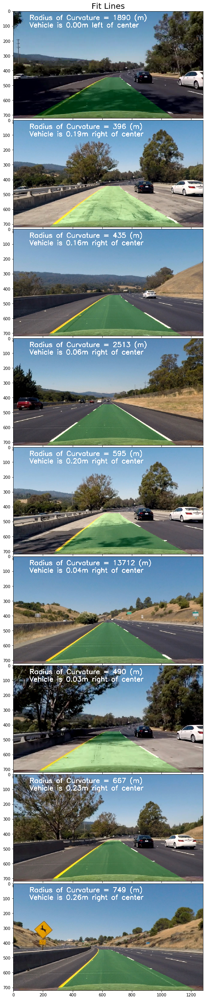

In [97]:
images_2_use = images#[4:]

# setting up plot
plt.figure(figsize=(15,5*len(images_2_use)))
plt.subplots_adjust(hspace = .02, wspace=.05)

for i in range(len(images_2_use)):
    img = mpimg.imread(images_2_use[i])
    img_orig = img.copy()
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img_undistort=img.copy()
    
    img=threshold_binary(img, debug=False)
    #print ("img.shape = {}".format(img.shape))
    
    img_thresh = img.copy()
    img, debug_img = ROI_selector(img)

    # Transforming the perspective
    warped, M_inv = transform_prespective(img, mtx, dist, debug=False)
    
    left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty = fitlines(warped, [], [], True)
    curve_rad = get_curv(lefty, leftx, righty, rightx, ploty)
    offset = get_offset(leftx, rightx, warped.shape)
    
    res = draw_lane(img_undistort, warped, left_fit, right_fit, ploty, curve_rad, offset, M_inv)
    
    #print ("Curvature Radius: {:.2f}m".format(curve_rad))
    # Plotting undistorted & wraped image
    cols = 1
    
    plt.subplot(len(images_2_use),cols,(i*cols)+1)
    if (i==0): plt.title('Fit Lines', fontsize=20)
    fig = plt.imshow(res)
    #break

## Main Pipeline function
It accepts a colored raw image and produces undistorted image with overlay showing curvature and offset values.

In [98]:
left_fit = []
right_fit = []
def pipeline(img):
    global left_fit, right_fit
    img_orig = img.copy()
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img_undistort=img.copy()
    
    img=threshold_binary(img, debug=False)
    #print ("img.shape = {}".format(img.shape))
    
    img_thresh = img.copy()
    img, debug_img = ROI_selector(img)

    # Transforming the perspective
    warped, M_inv = transform_prespective(img, mtx, dist, debug=False)
    
    # We use the previously found polynomials to start the new search in every frame
    left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty = fitlines(warped,left_fit,right_fit, True)
    curve_rad = get_curv(lefty, leftx, righty, rightx, ploty)
    offset = get_offset(leftx, rightx, warped.shape)
    
    result = draw_lane(img_undistort, warped, left_fit, right_fit, ploty, curve_rad, offset, M_inv)

    return result

### Test rig for pipeline function

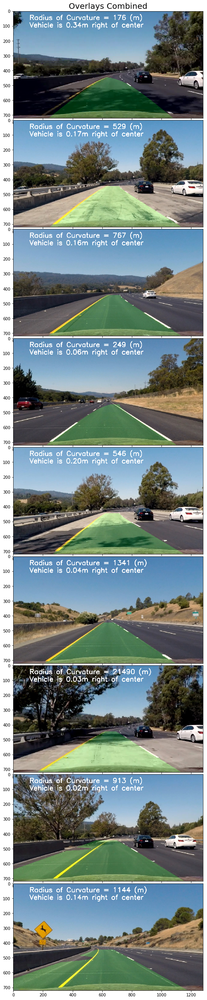

In [99]:
images_2_use = images#[4:6]

plt.figure(figsize=(15,5*len(images_2_use)))
plt.subplots_adjust(hspace = .02, wspace=.05)

for i in range(len(images_2_use)):
    img = mpimg.imread(images_2_use[i])
    res = pipeline(img)
    
        # Plotting undistorted & wraped image
    cols = 1
    
    plt.subplot(len(images_2_use),cols,(i*cols)+1)
    if (i==0): plt.title('Overlays Combined', fontsize=20)
    fig = plt.imshow(res)

In [100]:
# video file pipeline
output = 'out_test_video.mp4'
clip1 = VideoFileClip("project_video.mp4")

out_clip = clip1.fl_image(pipeline)
%time out_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video out_test_video.mp4
[MoviePy] Writing video out_test_video.mp4


100%|█████████▉| 1260/1261 [05:30<00:00,  3.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_test_video.mp4 

CPU times: user 3min 28s, sys: 3.08 s, total: 3min 31s
Wall time: 5min 33s


In [102]:
HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))